# Imports

In [1]:
import pandas as pd 
# import datatable as dt
# import geopandas as gpd
import numpy as np
import gc
import re

#plotting
import matplotlib.pyplot as plt 
import seaborn as sns

#map
import folium 


#preprocessing 
from sklearn.base import TransformerMixin
from sklearn.pipeline import Pipeline

# Dataset Description


    1)business.json  : Contains business data including location data, attributes, and categories.
    2)review.json   : Contains full review text data including the user_id that wrote the review and the business_id the review is written for.
    3)user.json     : User data including the user's friend mapping and all the metadata associated with the user.
    4)checkin.json  : Checkins on a business.
    5)tips.json    : Tips written by a user on a business. Tips are shorter than reviews and tend to convey quick suggestions.

# 1) Business Data

     The objective of this section is to Filter Businesses that are not restaurants , and then extract and one hot encode the restaurant features and categories. 

In [2]:
%%time
business = pd.read_json('../input/yelp-dataset/yelp_academic_dataset_business.json',
                        lines=True)


#finding restaurants restaurants
business['restaurant']= (business.categories.str.contains(pat='Restaurant',
                                                          flags=re.IGNORECASE,
                                                          regex=True))

CPU times: user 3.35 s, sys: 994 ms, total: 4.34 s
Wall time: 6 s


**Subsetting data to include data with restaurants and that are open**

In [3]:
required_columns = ['business_id','name','stars','categories','review_count','attributes']  # columns to use 

#saving restaurants  as csv 
restaurants = business[(business.restaurant==1) & (business.is_open==1)].reset_index(drop=True)

#keeping required cols 
restaurants=restaurants.loc[:,required_columns]


restaurant_list = restaurants.business_id.unique()   # list of restaurants ids 

print(f'{len(restaurants)} Restaurants(That are Open) in the Dataset')

32049 Restaurants(That are Open) in the Dataset


In [4]:
class category_ohe(TransformerMixin):
    '''One hot encode multicategory categorical columns'''
    
    def __init__(self,
                df):
        super().__init__()
        
        self.df = df.copy(deep=True)
        self.df.reset_index(inplace=True,drop=True) # reset index
         
    def transform(self,
                 category_columns='categories',
                 split=','):
        '''One hot Encode category columns,delete original columns from dataset''' 
        
        if isinstance(category_columns,list):
        
            for col in category_columns:
                encoded=pd.Series(self.df[col]).str.get_dummies(split)  # one hot encode multicategories

                self.df = self.df.merge(encoded,how='inner',left_index=True,right_index=True)  
        
        else:
            encoded=pd.Series(self.df[category_columns]).str.get_dummies(split)  # one hot encode multicategories

            self.df = self.df.merge(encoded,how='inner',left_index=True,right_index=True)  
            
        
        self.df.drop(category_columns,axis=1,inplace=True)  # drop category columns
        
        
        return self.df 
    
    
    
class extract_attributes(TransformerMixin):
    '''extract attributes that are nested inside (nested)dictionary'''
    def __init__(self,
                df):
        super().__init__()
        
        self.df = df.copy(deep=True)
        self.df.reset_index(inplace=True,drop=True) # reset index
        
        
        
    #from https://www.kaggle.com/zolboo/recommender-systems-knn-svd-nn-keras/notebook
    # Function that extract keys from the nested dictionary
    def extract_keys(self,attr, key):
        if attr == None:
            return "{}"
        if key in attr:
            return attr.pop(key)

    # convert string to dictionary
    def str_to_dict(self,attr):
        import ast
        if attr != None:
            return ast.literal_eval(attr)
        else:
            return ast.literal_eval("{}")  
        
    def extract_attributes(self,
                           attributes_list):
        for attrib in attributes_list:
            
            self.df[attrib]=self.df.apply(lambda x: self.str_to_dict(self.extract_keys(x['attributes'], attrib)), axis=1)
            
        
    def encode_attributes(self,attributes_list):
        
        # create table with attribute dummies
        ls = []
        for attrib in attributes_list:
            ls.append(self.df[attrib].apply(pd.Series))
        
        #concat attributes
        df_attr = pd.concat(ls, axis=1)
        # one hot encode
        df_attr_dummies = pd.get_dummies(df_attr)
        
        #merge the encoded attributes with df 
        self.df = self.df.merge(df_attr_dummies,left_index=True,right_index=True,how='inner')
        
    def transform(self,attributes_list=['Ambience','GoodForMeal','Dietary','Music']):
        
        _ = self.extract_attributes(attributes_list) # get attributes 
        _ = self.encode_attributes(attributes_list)  # one hot encode attributes 
        
        attributes_list.append('attributes')
        print('Dropping Attributes after encoding')
        self.df.drop(attributes_list,axis=1,inplace=True)
        
        return self.df 
    
    

**One hot Encode Categories**

In [5]:
restaurants_encoded = category_ohe(df=restaurants).transform() 

**One hot Encode other attributes in Attribute Field**

In [6]:
restaurants_encoded = extract_attributes(df=restaurants_encoded).transform()

Dropping Attributes after encoding


**Saving the Restaurants as a csv file for further use.**

In [7]:
print(f'Shape of the Transformed Dataset is {restaurants_encoded.shape}')

restaurants_encoded.to_csv('restaurants.csv',index=False)

Shape of the Transformed Dataset is (32049, 1102)


# Where are our Restaurants located ??

In [8]:
from folium.plugins import HeatMap,MarkerCluster

m1=folium.Map(location = (37,-95),
              max_zoom=12,min_zoom=4,zoom_start=6,
              tiles='open street map')

locations = business.loc[business.restaurant==1,['latitude','longitude']]
cluster = MarkerCluster(locations=locations,
                       ).add_to(m1)
    
m1

Text(0.5, 1.0, 'Distribution of Restaurant Ratings')

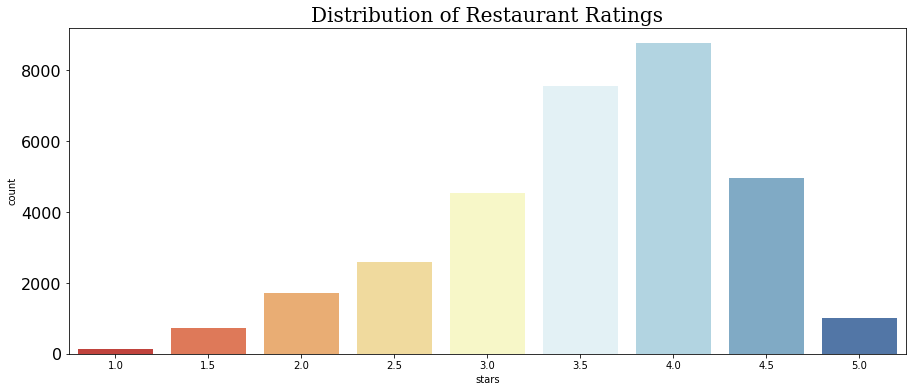

In [9]:
#distribution of stars 
fig,ax= plt.subplots(figsize=(15,6))
plt.yticks(fontsize=16)


sns.countplot(x="stars",
              data=restaurants,
              palette="RdYlBu",
              linewidth=3)

plt.title("Distribution of Restaurant Ratings",
          font="Serif",
          size=20,color='k')



# 2) User Reviews

    In this section, we will filter user reviews to keep only the restaurant reviews. As the size of the dataset is large, we will load it in chunks to avoid out of memory errors.

In [10]:
#taking these columns for reviews 
required_columns2 = ['user_id','business_id','useful','stars','funny','cool','year_over_base']



review_dict = {'id_cols': ['user_id','business_id'],
               'review_cols': ['stars','useful','funny','cool']
              }

**Loading In the dataset in chunks, and filtering the required reviews (restaurants)**

In [11]:
def to_datetime(df,
                datetime_column,
                frmt=None):
    '''convert a column to datetime object'''
    df[datetime_column] = pd.to_datetime(df[datetime_column],
                                         format= frmt)
    
    return None
    
def get_year(df,
             datetime_column='date',
             base_year=2004):
    '''get years passed over the base year column in dataset'''
    
    _ = to_datetime(df,datetime_column)
    
    
    # recentness of review
    df['year_over_base'] = df[datetime_column].dt.year - base_year
    
    return None

In [12]:
%%time
#loading data in chunks to avoid memory errors 
reviews = pd.read_json('../input/yelp-dataset/yelp_academic_dataset_review.json',
                       lines=True,
                       orient='columns',
                       chunksize=100000)



restaurant_reviews = pd.DataFrame()
review_count = 0 
total_reviews =0

# as we are only concerned with restaurants , we will take only those reviews 
for chunk_df in reviews:
    
    total_reviews += chunk_df.shape[0]
    
    #take only those rows which business ids are present in the restaurants df 
    restaurants = chunk_df[chunk_df['business_id'].isin(restaurant_list)].reset_index(drop=True)
    review_count += len(restaurants)
    
    
    #get the year of review (as differnece over base year == 2004)
    _ = get_year(restaurants)
    
    #append the columns to DF  
    restaurant_reviews=restaurant_reviews.append(restaurants[required_columns2])
    


print(f'There are total {total_reviews} reviews (including restaurant reviews)')
print(f'There are total {review_count} Restaurant reviews in the dataset')
    
assert review_count == restaurant_reviews.shape[0] , 'Hello Darkness my old (only) Friend'

There are total 8635403 reviews (including restaurant reviews)
There are total 4305580 Restaurant reviews in the dataset
CPU times: user 2min 18s, sys: 26.2 s, total: 2min 44s
Wall time: 4min 16s


In [13]:
print(f'There are {restaurant_reviews.user_id.nunique()} unique Users in the restaurant reviews dataset')
print(f'There are {restaurant_reviews.business_id.nunique()} unique Restaurants in the restaurant reviews dataset')

There are 1364404 unique Users in the restaurant reviews dataset
There are 32049 unique Restaurants in the restaurant reviews dataset


**WHat % of restaurants have reviews ?**

In [14]:
print(f'% of Restaurants with reviews :  {round((restaurant_reviews.business_id.nunique()/len(restaurant_list))* 100 )}')

% of Restaurants with reviews :  100


In [15]:
#saving user ids for future use 
restaurant_review_user_list = restaurant_reviews.user_id.unique()

**HOW are users Rating restaurants?**

Text(0.5, 1.0, 'Distribution of Restaurant Review Ratings')

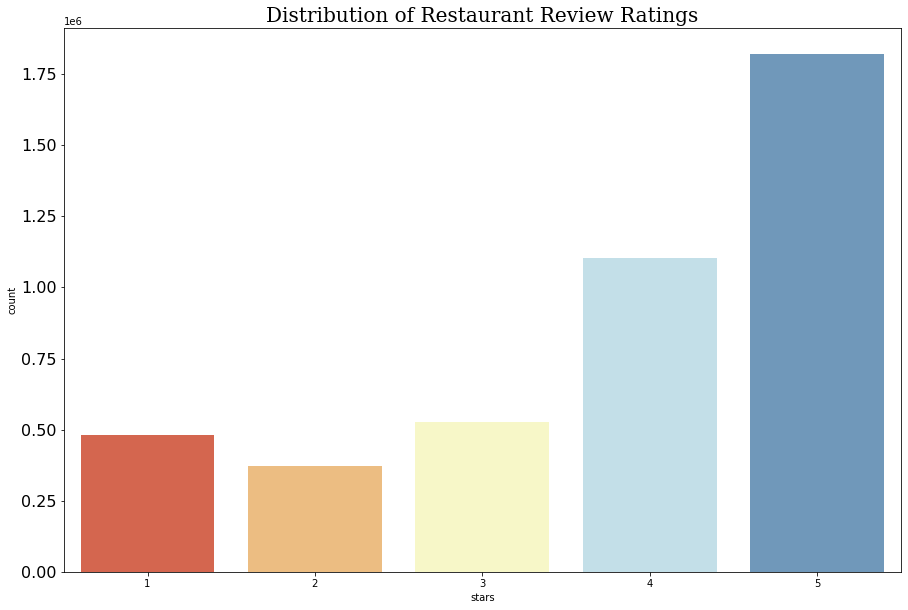

In [16]:
fig,ax= plt.subplots(figsize=(15,10))
plt.yticks(fontsize=16)


sns.countplot(x="stars",
              data=restaurant_reviews,
              palette="RdYlBu",
              linewidth=3)

plt.title("Distribution of Restaurant Review Ratings",
          font="Serif",
          size=20,color='k')


**When were these restaurants rated ?**

Text(0.5, 1.0, 'Count of reviews per year')

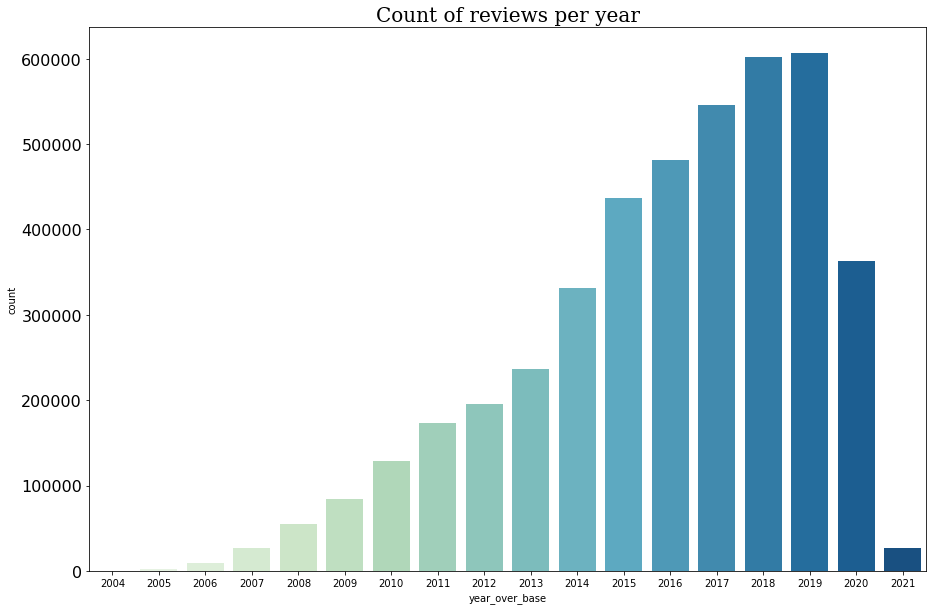

In [17]:
fig,ax= plt.subplots(figsize=(15,10))
plt.yticks(fontsize=16)

years = restaurant_reviews.year_over_base + 2004

sns.countplot(x=years,
              palette="GnBu",
              linewidth=3)

plt.title("Count of reviews per year",
          font="Serif",
          size=20,color='k')


**How many ratings do users have ?**

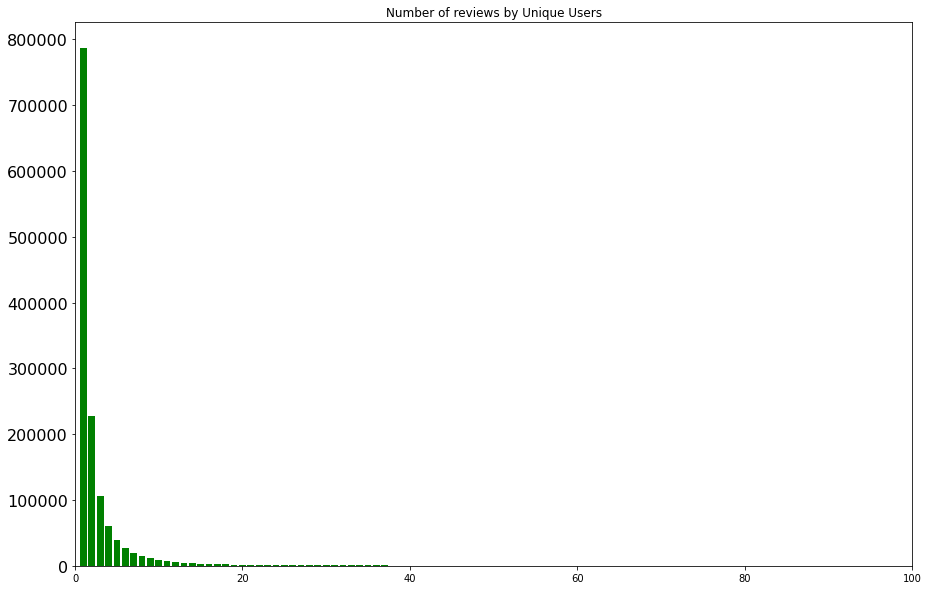

In [18]:
rating_count_count = restaurant_reviews.user_id.value_counts().value_counts()  # forgive me for this ;-

fig,ax= plt.subplots(figsize=(15,10))
plt.yticks(fontsize=16)


plt.bar(x=rating_count_count.index,height=rating_count_count,
        color='g')
plt.xlim((0,100))  # as the reviews beyond 100 are very few, clipping the values till 100
plt.title('Number of reviews by Unique Users')
plt.show()

**Saving the restaurant reviews as csv**

In [19]:
#saving restaurant reviews as a csv 

restaurant_reviews.to_csv('restaurant_reviews.csv',
                          index=False)


# 3) User Information Data 

    In this sections , we will extract the information of users that have written reviews in the restaurant reviews section, and extract some relevant information.

In [20]:
required_cols3 = ['user_id','review_count','yelping_since','useful','funny','cool','elite','fans','average_stars','compliment_hot'
                 ,'compliment_more','compliment_profile','compliment_cute','compliment_list','compliment_note','compliment_plain',
                 'compliment_cool','compliment_funny','compliment_writer','compliment_photos','f_count']

In [21]:
%%time
user_data = pd.read_json('../input/yelp-dataset/yelp_academic_dataset_user.json',
                       lines=True,
                       orient='columns',
                       chunksize=100000)


    
user_df = pd.DataFrame()
user_count = 0 
total_users =0

# as we are only concerned with restaurants , we will take only those users with restaurant reviews 
for chunk_df in user_data:    
    
    total_users += chunk_df.shape[0]
    
    #take only those rows which user ids are present in the restaurants review user ids  
    users = chunk_df[chunk_df['user_id'].isin(restaurant_review_user_list)].reset_index(drop=True)
    user_count += len(users)
    
    
    _ = to_datetime(df=users,datetime_column='yelping_since')
    users['yelping_since'] = users['yelping_since'].dt.year
    
    
    #count numof friends user has 
    users['f_count']  = users['friends'].apply(lambda x: len(x.split(',')))
    #append the rows and columns to DF  
    user_df=user_df.append(users[required_cols3])
    


print(f'There are total {total_users} Users (including users with restaurant reviews)')
print(f'There are total {user_count} Users with Restaurant reviews in the dataset')
    
assert user_count == user_df.shape[0] , 'Knock Knock Whos there? Stupidity you stupid.'

There are total 2189457 Users (including users with restaurant reviews)
There are total 1364404 Users with Restaurant reviews in the dataset
CPU times: user 1min 19s, sys: 15.1 s, total: 1min 34s
Wall time: 2min 13s


**The column elite has years when a specific user is classified as elite user. One Hot encoding that column.**

In [22]:
user_df = category_ohe(user_df).transform(category_columns='elite', #one hot encode this multilabel col
                                           split=',')  # split along this chr the str 

print(f'User meta-data shape : {user_df.shape}')

User meta-data shape : (1364404, 35)


**So , how is the average ratings of our selected Users?**

Text(0.5, 1.0, 'Average Rating of Users')

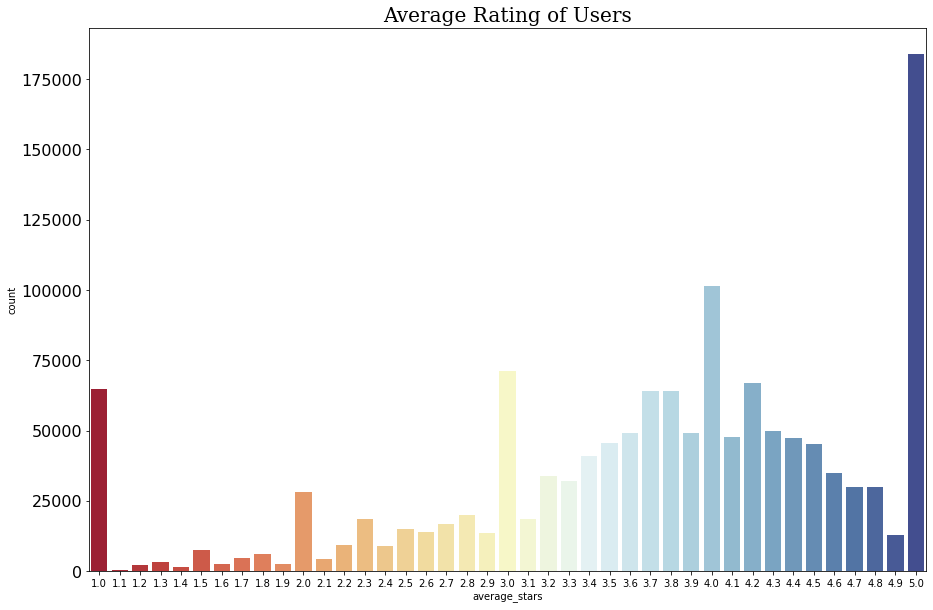

In [23]:
fig,ax= plt.subplots(figsize=(15,10))
plt.yticks(fontsize=16)


sns.countplot(x=user_df.average_stars.round(decimals=1),
              palette="RdYlBu",
              linewidth=3)

plt.title("Average Rating of Users",
          font="Serif",
          size=20,color='k')


**When have these users been using yelp?**

Text(0.5, 1.0, 'Yelp users count over years')

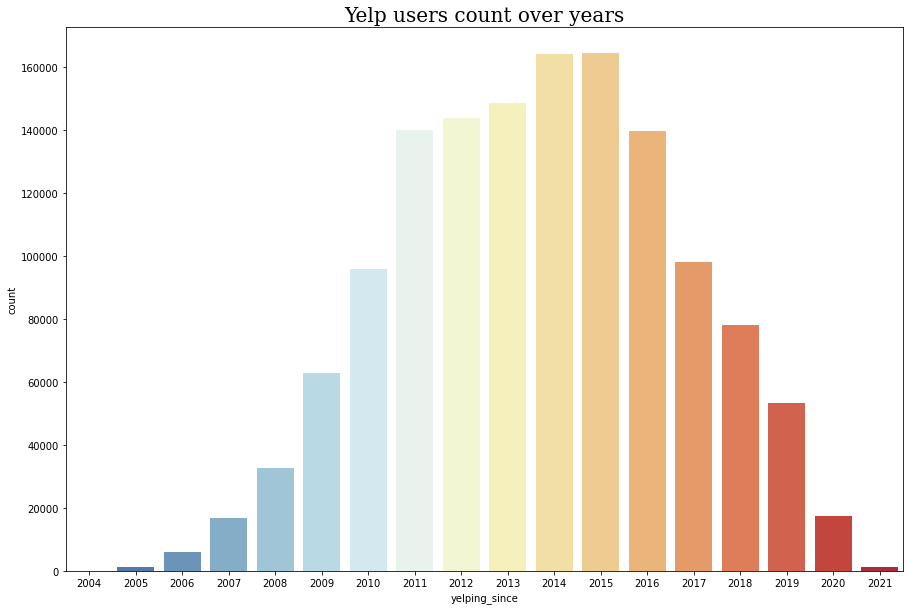

In [24]:
fig,ax= plt.subplots(figsize=(15,10))

sns.countplot(x=user_df.yelping_since,
              palette="RdYlBu_r",
              linewidth=3)

plt.title("Yelp users count over years",
          font="Serif",
          size=20,color='k')


**Saving user metadata**

In [25]:
user_df.to_csv('users_metadata.csv',index=False)

# How to join these datasets

    1) "restaurants.csv" has column "business_id" which can be used to join "restaurant_reviews.csv" on " business_id".
    
    2) "restaurant_reviews.csv" has "user_id" , which can be used to join to "user_metadata.csv" on "user_id".

# References and Resources 

* https://www.kaggle.com/zolboo/recommender-systems-knn-svd-nn-keras/notebook
* https://www.kaggle.com/ambarish/a-very-extensive-data-analysis-of-yelp